In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2
import zipfile
import os

In [ ]:
zip_file_path = "/content/Images.zip"
destination_directory = "/content/Images"

if not os.path.exists(destination_directory):
    os.makedirs(destination_directory)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(destination_directory)


Extraction complete.


## Grad CAM

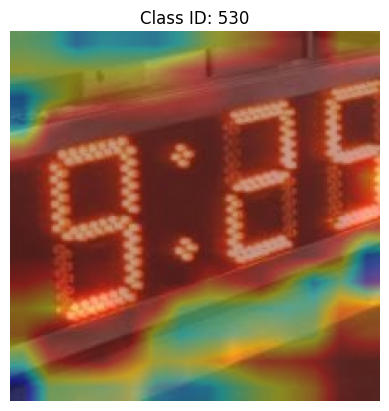

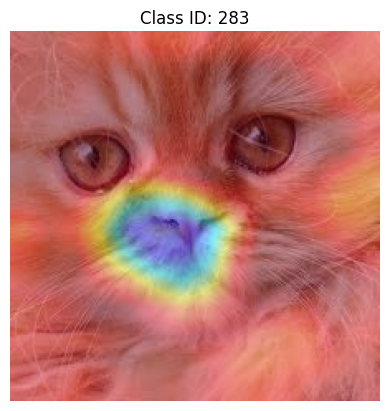

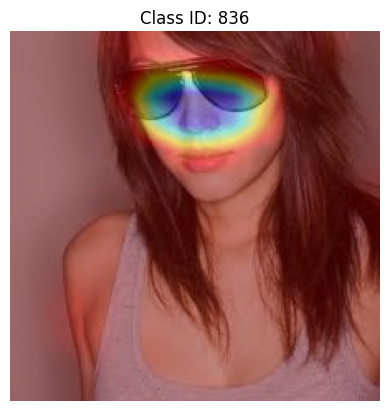

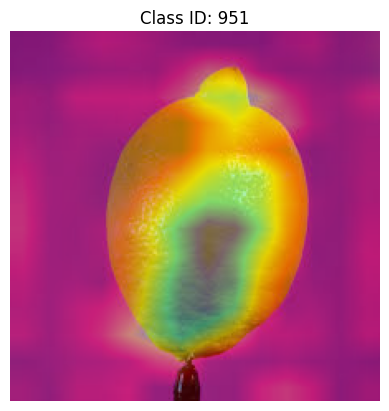

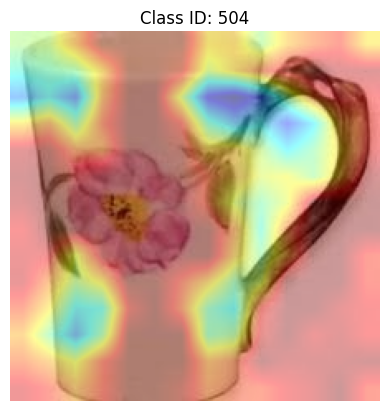

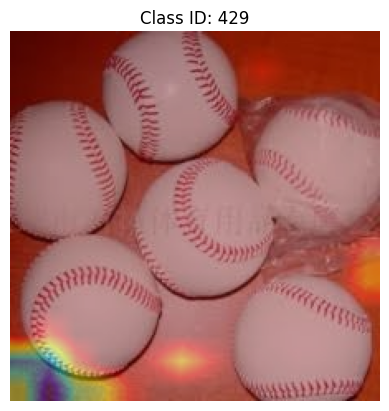

Skipping file .DS_Store as it doesn't follow the expected format.


In [ ]:
model = VGG16(weights='imagenet')
last_conv_layer = model.get_layer('block5_conv3')
model = tf.keras.Model([model.inputs], [last_conv_layer.output, model.output])

image_dir = '/content/Images/Images/Images'

for img_name in os.listdir(image_dir):
    try:
        class_idx = int(img_name.split('.')[0])  
    except ValueError:
        print(f"Skipping file {img_name} as it doesn't follow the expected format.")
        continue

    img_path = os.path.join(image_dir, img_name)

    img = image.load_img(img_path, target_size=(224, 224))
    img_width, img_height = img.size  
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    x_tensor = tf.convert_to_tensor(x) 

    img_array = np.array(img)

    with tf.GradientTape() as tape:
        tape.watch(x_tensor)
        last_conv_outputs, predictions = model(x_tensor)
        class_output = predictions[:, class_idx]

    grads = tape.gradient(class_output, last_conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    weighted_feature_maps = tf.multiply(pooled_grads, last_conv_outputs[0])

    heatmap = tf.reduce_mean(weighted_feature_maps, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    max_heat = tf.reduce_max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10 
    heatmap /= max_heat

    heatmap = heatmap.numpy()
    heatmap = cv2.resize(heatmap, (img_width, img_height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = cv2.addWeighted(heatmap, 0.4, img_array, 0.6, 0)
    superimposed_img = superimposed_img.astype('uint8')

    plt.imshow(superimposed_img)
    plt.title(f"Class ID: {class_idx}")
    plt.axis('off')
    plt.show()



## Guided backpropagation

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook 

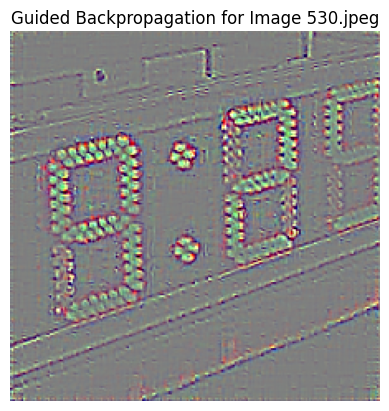

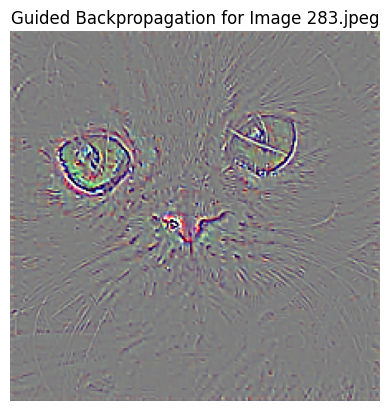

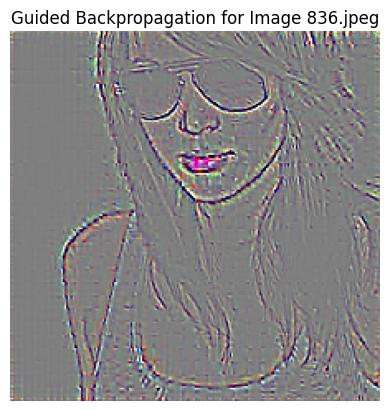

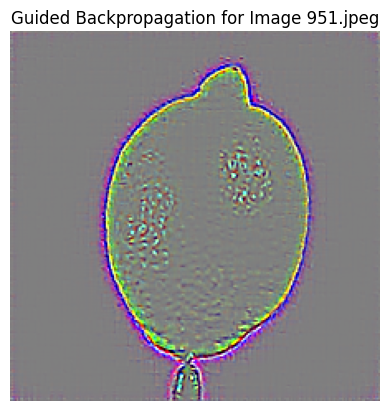

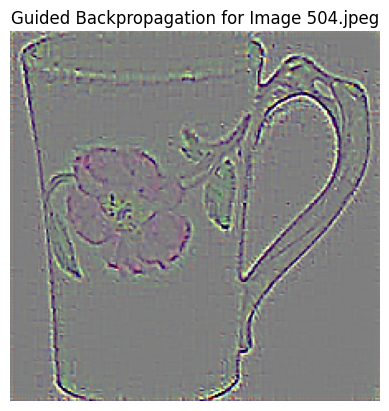

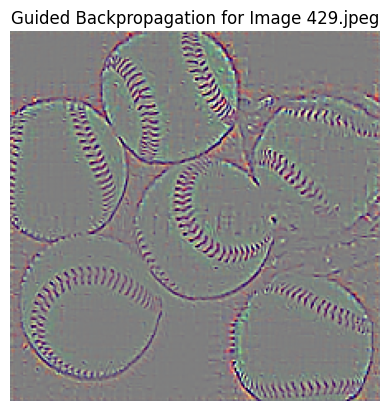

In [ ]:
class GuidedBackprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval()  
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)

        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None):
        model_output = self.model(input_image)
        self.model.zero_grad()
        pred_class = model_output.argmax().item()
        grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
        grad_target_map[0][target_class if target_class is not None else pred_class] = 1
        model_output.backward(grad_target_map)
        result = self.image_reconstruction.data[0].permute(1, 2, 0)
        return result.numpy()

def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

model = models.vgg16(pretrained=True)
GBP = GuidedBackprop(model)
image_dir = '/content/Images/Images/Images'
image_files = [x for x in os.listdir(image_dir) if x.lower().endswith(('png', 'jpg', 'jpeg'))]

for img_name in image_files:
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    img_tensor = transform(img).unsqueeze(0).requires_grad_(True)
    guided_result = GBP.visualize(img_tensor)

    guided_result = normalize(guided_result)
    plt.imshow(guided_result)
    plt.title(f"Guided Backpropagation for Image {img_name}")
    plt.axis('off')
    plt.show()


## Guided Grad-CAM

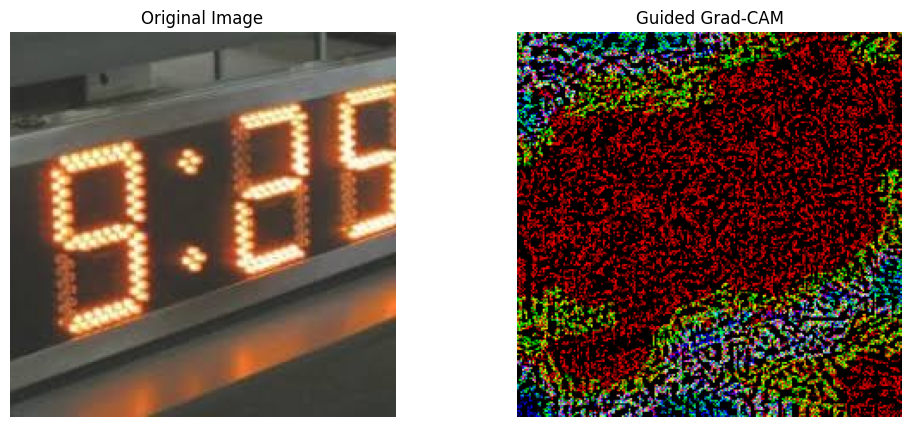

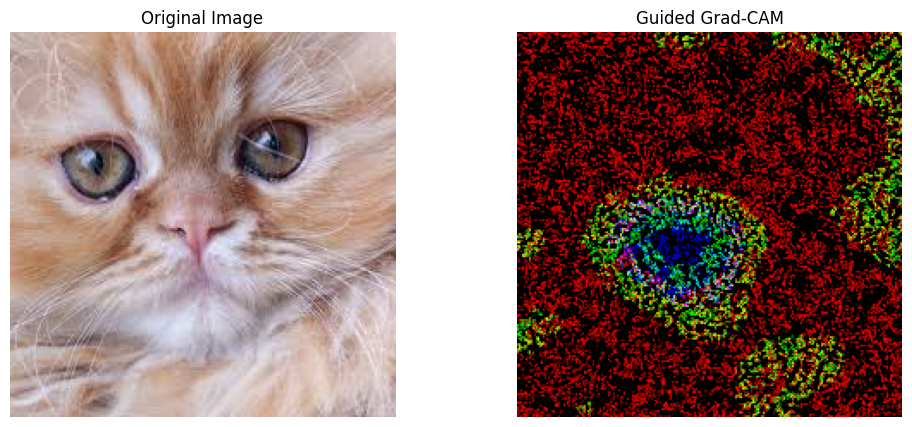

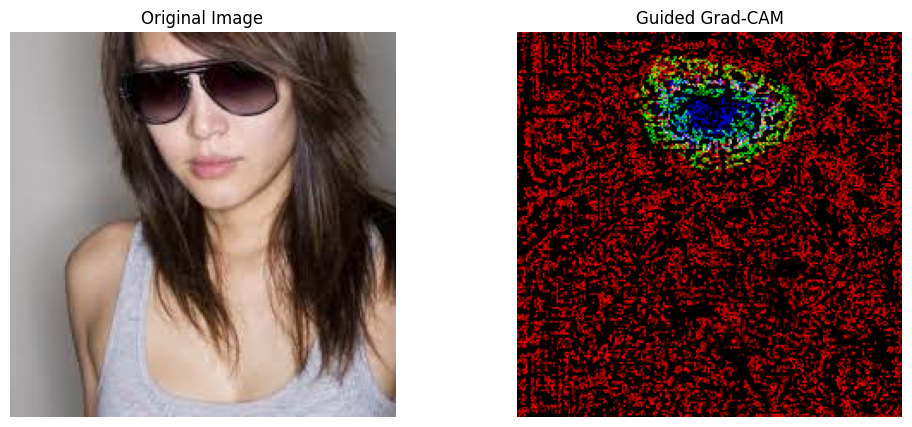

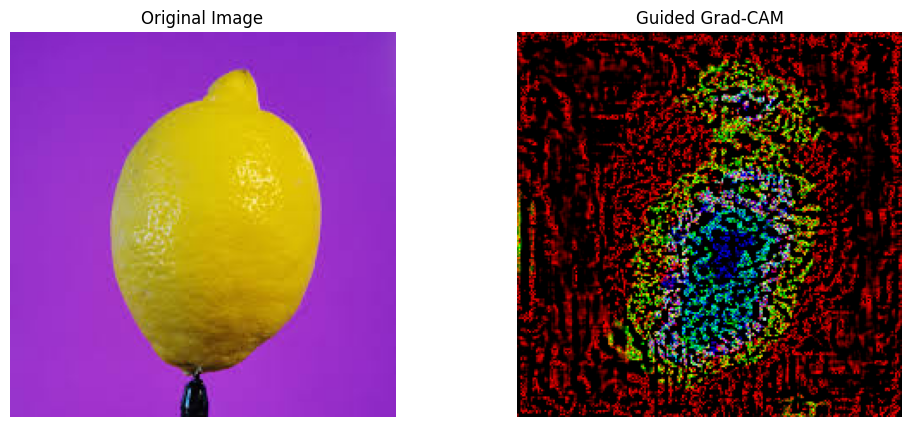

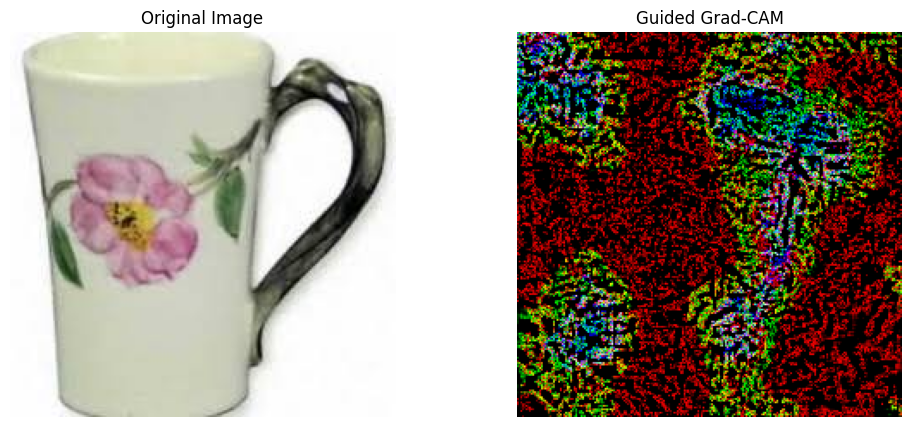

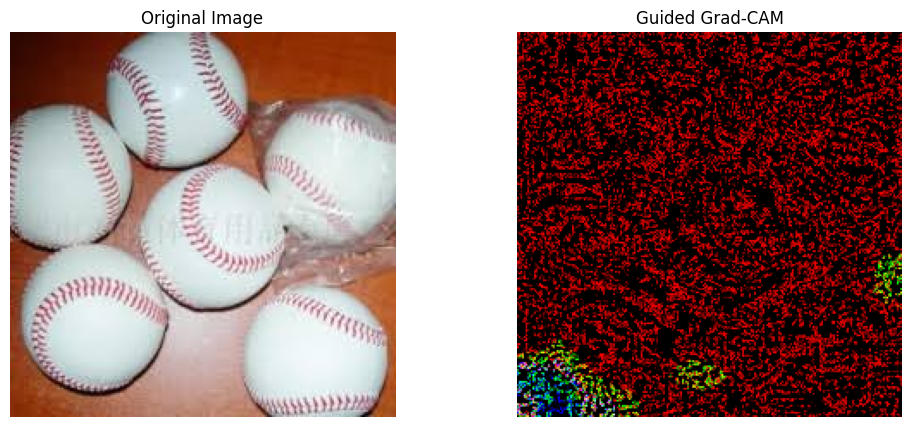

Skipping file .DS_Store as it doesn't follow the expected format.


In [ ]:
model = VGG16(weights='imagenet')
model = Model(inputs=model.inputs, outputs=[model.get_layer('block5_conv3').output, model.output])

@tf.custom_gradient
def guidedRelu(x):
    def grad(dy):
        return tf.cast(dy > 0, "float32") * tf.cast(x > 0, "float32") * dy
    return tf.nn.relu(x), grad

for layer in model.layers:
    if hasattr(layer, 'activation') and layer.activation == tf.nn.relu:
        layer.activation = guidedRelu

image_dir = '/content/Images/Images/Images'

for img_name in os.listdir(imagedir):
    try:
        class_idx = int(img_name.split('.')[0]) 
    except ValueError:
        print(f"Skipping file {img_name} as it doesn't follow the expected format.")
        continue

    img_path = os.path.join(image_dir, img_name)
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    x_tensor = tf.convert_to_tensor(x)

    with tf.GradientTape(persistent=True) as tape:
        tape.watch(x_tensor)
        conv_outputs, predictions = model(x_tensor)
        loss = predictions[:, class_idx]

    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, output), axis=-1)
    heatmap = np.maximum(heatmap.numpy(), 0)  
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    grads = tape.gradient(loss, x_tensor)[0].numpy()  

    guided_grad_cam = cv2.resize(heatmap, (224, 224))
    guided_grad_cam = cv2.applyColorMap(np.uint8(255 * guided_grad_cam), cv2.COLORMAP_JET)
    guided_backprop = np.maximum(grads, 0)
    guided_backprop /= np.max(guided_backprop)
    guided_grad_cam = np.float32(guided_backprop) * np.float32(guided_grad_cam)
    guided_grad_cam = np.uint8(255 * guided_grad_cam)

    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    ax[0].imshow(img)
    ax[0].set_title("Original Image")
    ax[0].axis('off')

    ax[1].imshow(guided_grad_cam)
    ax[1].set_title("Guided Grad-CAM")
    ax[1].axis('off')

    plt.show()

    del tape 


## SmoothGrad_BackProb

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook 

predicted class ids ModeResult(mode=530, count=25)	 probability 0.9675118327140808


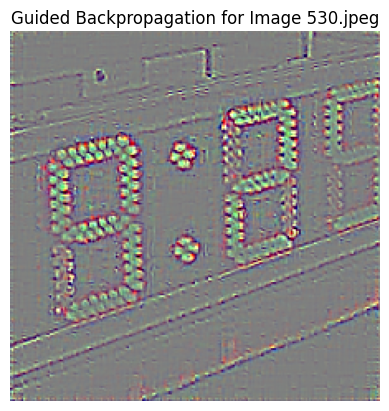

predicted class ids ModeResult(mode=283, count=25)	 probability 0.4934678375720978


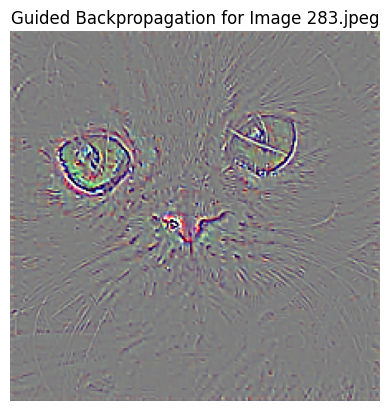

predicted class ids ModeResult(mode=903, count=25)	 probability 0.7249972820281982


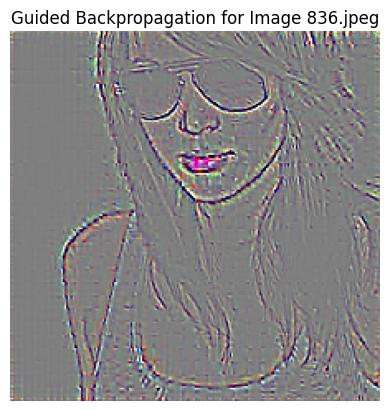

predicted class ids ModeResult(mode=852, count=25)	 probability 0.19685304164886475


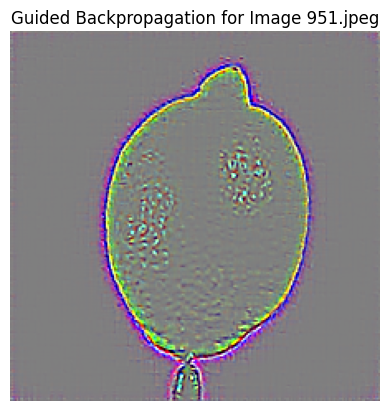

predicted class ids ModeResult(mode=899, count=25)	 probability 0.40998604893684387


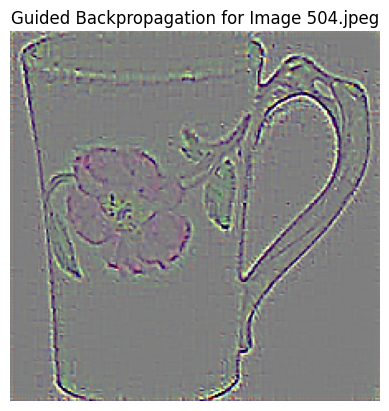

In [ ]:
from PIL import Imagei
from scipy.stats import mode

class GuidedBackprop():
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval() 
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)

        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None):
        self.model.zero_grad()
        model_output = self.model(input_image)
        pred_class = model_output.argmax().item()

        smoothgradcampp = SmoothGradCAMpp(self.model, self.target_layer)
        total_cams, idx = smoothgradcampp(input_image)

        grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
        grad_target_map[0][target_class if target_class is not None else pred_class] = 1
        model_output.backward(grad_target_map)
        result = self.image_reconstruction.data[0].permute(1, 2, 0)
        return result.numpy()

def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

class SmoothGradCAMpp():

    def __init__(self, model, target_layer, n_samples=25, stdev_spread=0.15):
        self.model = model
        self.target_layer = target_layer
        self.n_samples = n_samples
        self.stdev_spread = stdev_spread

    def forward(self, x, idx=None):
        stdev = self.stdev_spread / (x.max() - x.min())
        std_tensor = torch.ones_like(x) * stdev

        indices = []
        probs = []

        for i in range(self.n_samples):
            self.model.zero_grad()

            x_with_noise = torch.normal(mean=x, std=std_tensor)
            x_with_noise.requires_grad_()

            score = self.model(x_with_noise)

            prob = F.softmax(score, dim=1)

            if idx is None:
                prob, idx = torch.max(prob, dim=1)
                idx = idx.item()
                probs.append(prob.item())

            indices.append(idx)

            score[0, idx].backward(retain_graph=True)

            if x_with_noise.grad is None:
                x_with_noise.grad = torch.zeros_like(x_with_noise)

            activations = x_with_noise.grad
            gradients = x_with_noise.grad

            n, c, _, _ = gradients.shape

            numerator = gradients.pow(2)
            denominator = 2 * gradients.pow(2)
            ag = activations * gradients.pow(3)
            denominator += \
                ag.view(n, c, -1).sum(-1, keepdim=True).view(n, c, 1, 1)
            denominator = torch.where(
                denominator != 0.0, denominator, torch.ones_like(denominator))
            alpha = numerator / (denominator + 1e-7)

            relu_grad = F.relu(score[0, idx].exp() * gradients)
            weights = \
                (alpha * relu_grad).view(n, c, -1).sum(-1).view(n, c, 1, 1)

            # shape => (1, 1, H', W')
            cam = (weights * activations).sum(1, keepdim=True)
            cam = F.relu(cam)
            cam -= torch.min(cam)
            cam /= torch.max(cam)

            if i == 0:
                total_cams = cam.clone()
            else:
                total_cams += cam

        total_cams /= self.n_samples
        idx = mode(indices)
        prob = torch.mean(torch.tensor(probs))

        print("predicted class ids {}\t probability {}".format(idx, prob))

        return total_cams.data, idx

    def __call__(self, x):
        return self.forward(x)

model = models.vgg16(pretrained=True)
target_layer = model.features[-1]  
GBP = GuidedBackprop(model, target_layer)

# Load and process images
image_dir = '/content/Images/Images/Images'
image_files = [x for x in os.listdir(image_dir) if x.lower().endswith(('png', 'jpg', 'jpeg'))]

for img_name in image_files:
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    img_tensor = transform(img).unsqueeze(0).requires_grad_(True)
    guided_result = GBP.visualize(img_tensor)

    guided_result = normalize(guided_result)
    plt.imshow(guided_result)
    plt.title(f"Guided Backpropagation for Image {img_name}")
    plt.axis('off')
    plt.show()


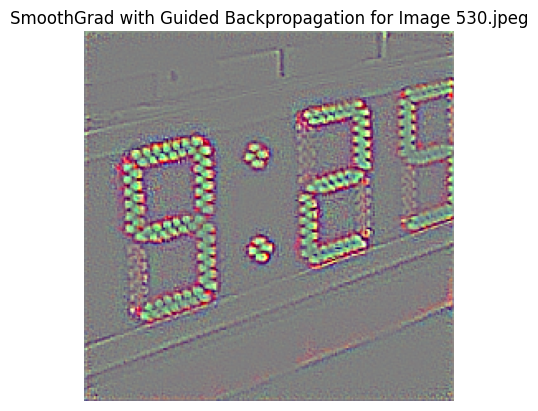

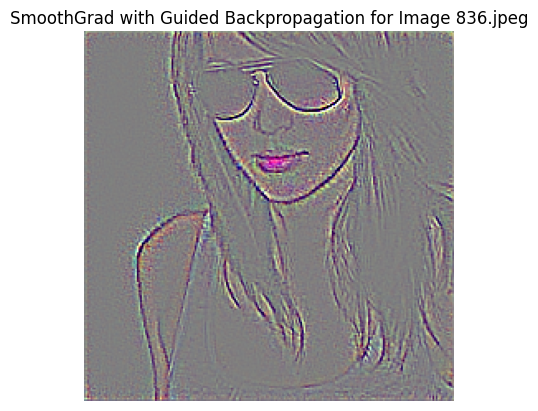

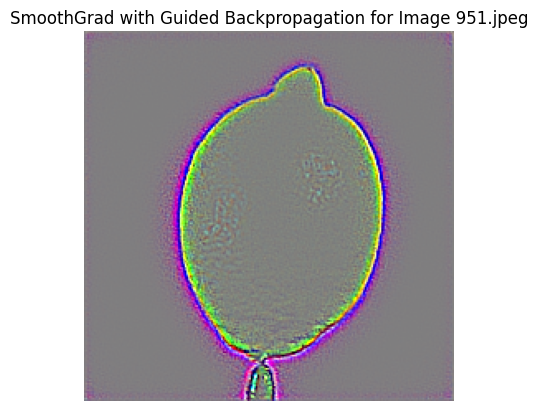

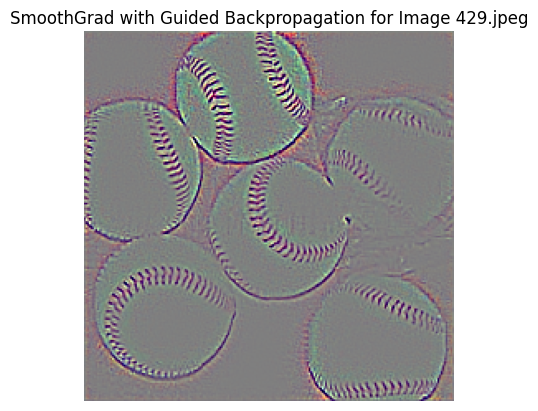

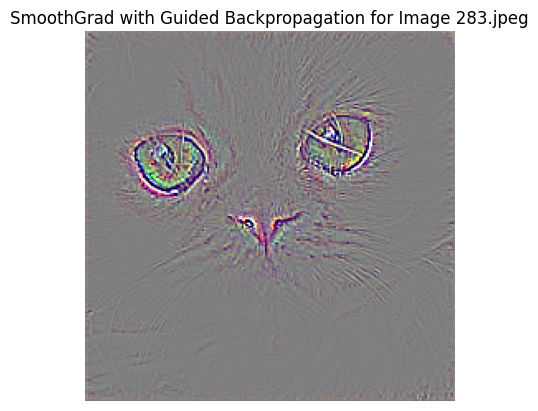

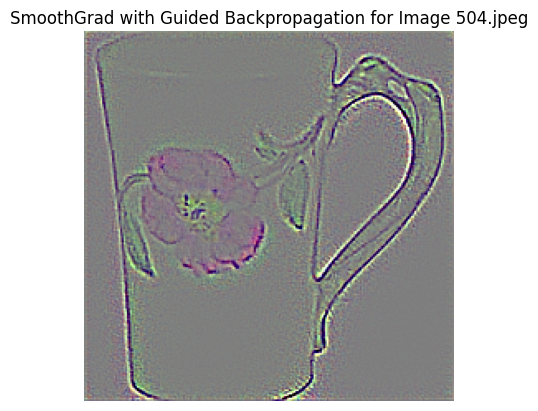

In [ ]:
class GuidedBackprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval() 
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1 
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

   
        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)
        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None, n_samples=30, noise_level=0.1):
      accumulated_grads = np.zeros(input_image.shape[2:] + (input_image.shape[1],)) 

      for _ in range(n_samples):
          noise = torch.randn(input_image.shape) * noise_level
          noisy_image = input_image + noise
          noisy_image = noisy_image.clone().detach().requires_grad_(True)
          model_output = self.model(noisy_image)
          self.model.zero_grad()
          pred_class = model_output.argmax().item()
          grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
          grad_target_map[0][target_class if target_class is not None else pred_class] = 1
          model_output.backward(grad_target_map)
          grad = self.image_reconstruction.squeeze(0).permute(1, 2, 0).cpu().numpy()  
          accumulated_grads += grad 

      return accumulated_grads / n_samples


def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

model = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
GBP = GuidedBackprop(model)

image_dir = '/content/Images/Images'
image_files = [x for x in os.listdir(image_dir) if x.lower().endswith(('png', 'jpg', 'jpeg'))]

for img_name in image_files:
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    img_tensor = transform(img).unsqueeze(0)
    img_tensor.requires_grad_(True)

    guided_result = GBP.visualize(img_tensor)

    guided_result = normalize(guided_result)
    plt.imshow(guided_result)
    plt.title(f"SmoothGrad with Guided Backpropagation for Image {img_name}")
    plt.axis('off')
    plt.show()


###### 0.4 noise level

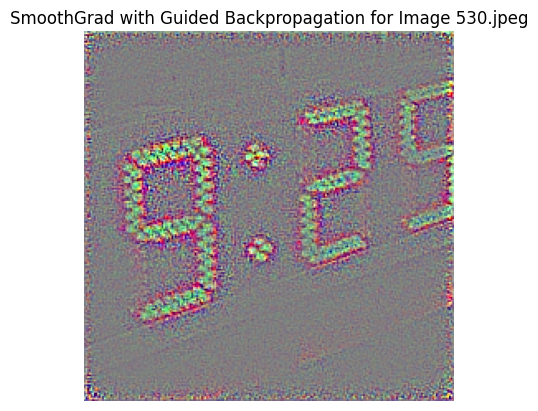

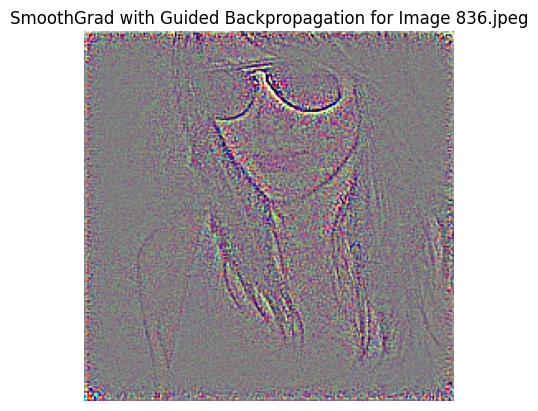

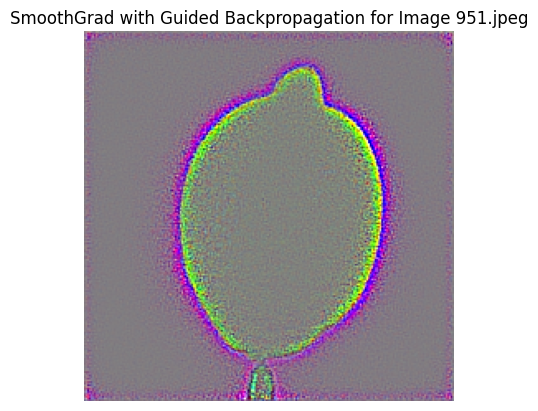

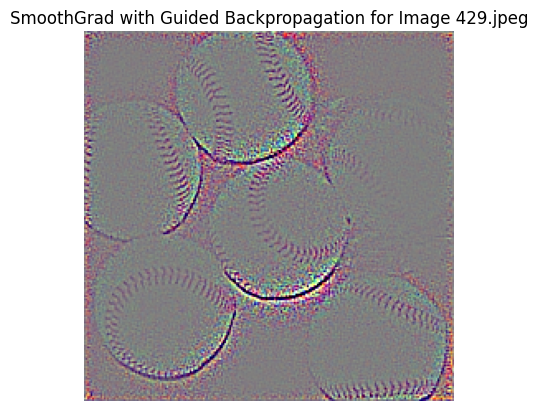

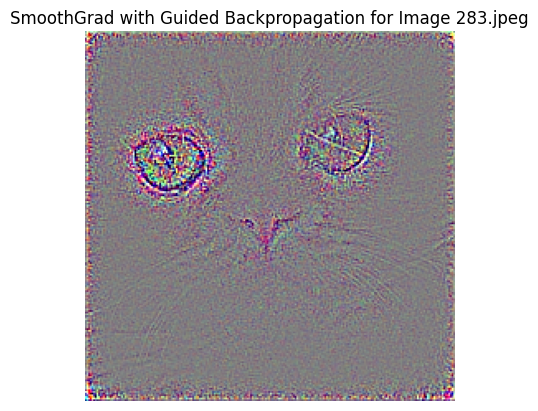

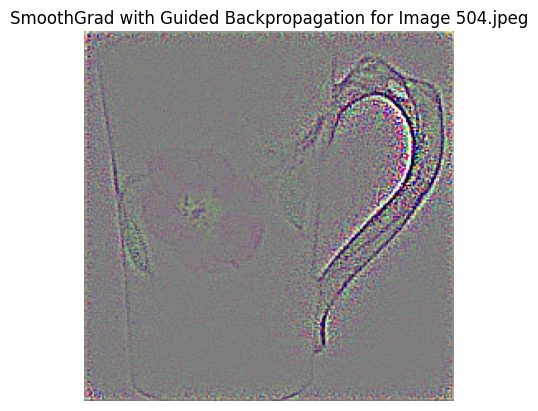

In [ ]:
from torchvision.models import VGG16_Weights
from PIL import Image


class GuidedBackprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval()  
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1 
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)
        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None, n_samples=30, noise_level=0.4):
      accumulated_grads = np.zeros(input_image.shape[2:] + (input_image.shape[1],)) 

      for _ in range(n_samples):
          noise = torch.randn(input_image.shape) * noise_level
          noisy_image = input_image + noise
          noisy_image = noisy_image.clone().detach().requires_grad_(True)
          model_output = self.model(noisy_image)
          self.model.zero_grad()
          pred_class = model_output.argmax().item()
          grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
          grad_target_map[0][target_class if target_class is not None else pred_class] = 1
          model_output.backward(grad_target_map)
          grad = self.image_reconstruction.squeeze(0).permute(1, 2, 0).cpu().numpy()  
          accumulated_grads += grad  

      return accumulated_grads / n_samples


def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

model = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
GBP = GuidedBackprop(model)

image_dir = '/content/Images/Images'
image_files = [x for x in os.listdir(image_dir) if x.lower().endswith(('png', 'jpg', 'jpeg'))]

for img_name in image_files:
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    img_tensor = transform(img).unsqueeze(0)
    img_tensor.requires_grad_(True)

    guided_result = GBP.visualize(img_tensor)

    guided_result = normalize(guided_result)
    plt.imshow(guided_result)
    plt.title(f"SmoothGrad with Guided Backpropagation for Image {img_name}")
    plt.axis('off')
    plt.show()


##### Noiese level = 0.8

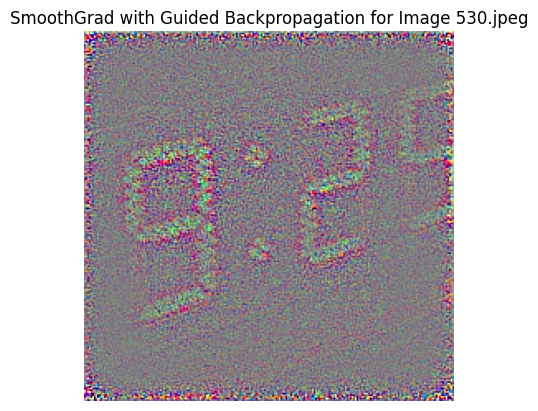

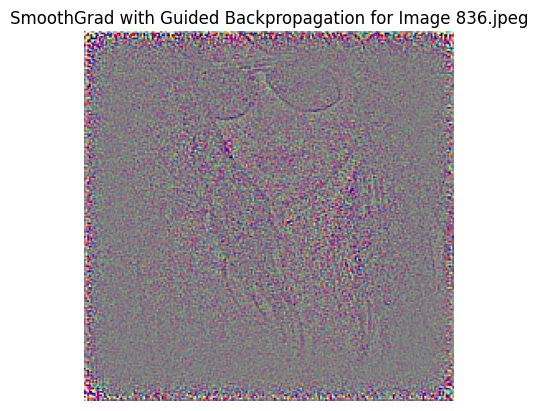

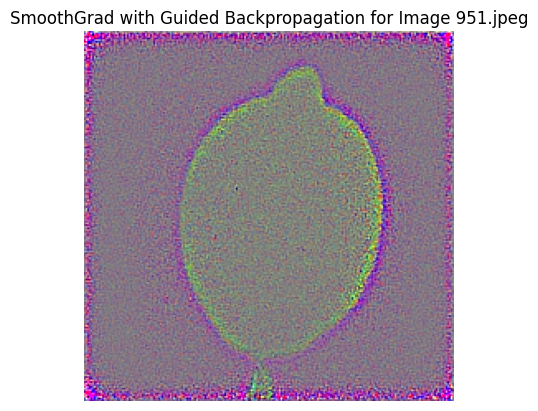

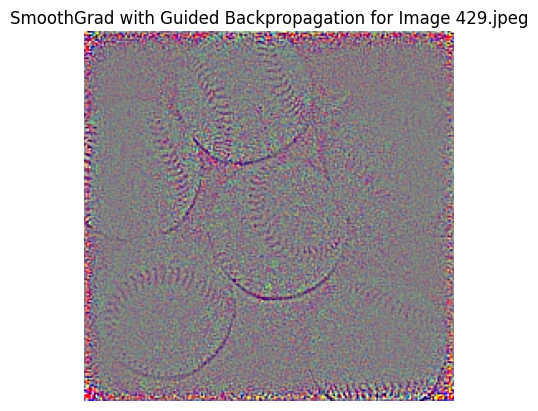

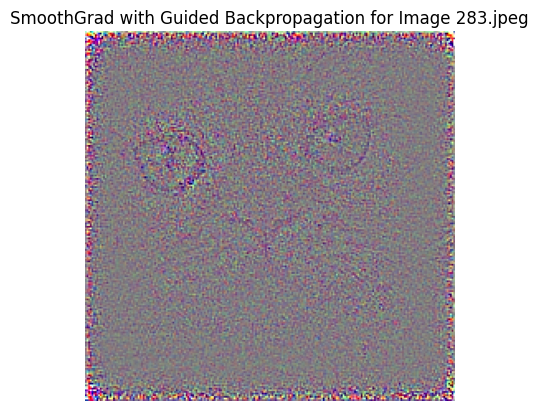

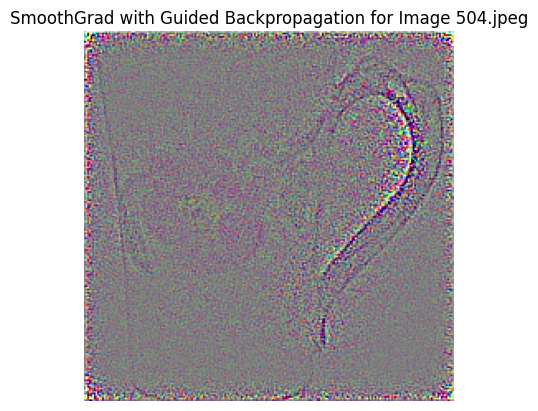

In [ ]:
class GuidedBackprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval() 
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1 
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)
        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None, n_samples=30, noise_level=0.8):
      accumulated_grads = np.zeros(input_image.shape[2:] + (input_image.shape[1],))  

      for _ in range(n_samples):
          noise = torch.randn(input_image.shape) * noise_level
          noisy_image = input_image + noise
          noisy_image = noisy_image.clone().detach().requires_grad_(True)
          model_output = self.model(noisy_image)
          self.model.zero_grad()
          pred_class = model_output.argmax().item()
          grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
          grad_target_map[0][target_class if target_class is not None else pred_class] = 1
          model_output.backward(grad_target_map)
          grad = self.image_reconstruction.squeeze(0).permute(1, 2, 0).cpu().numpy() 
          accumulated_grads += grad 

      return accumulated_grads / n_samples


def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

model = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
GBP = GuidedBackprop(model)

image_dir = '/content/Images/Images'
image_files = [x for x in os.listdir(image_dir) if x.lower().endswith(('png', 'jpg', 'jpeg'))]

for img_name in image_files:
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    img_tensor = transform(img).unsqueeze(0)
    img_tensor.requires_grad_(True)

    guided_result = GBP.visualize(img_tensor)
    guided_result = normalize(guided_result)
    plt.imshow(guided_result)
    plt.title(f"SmoothGrad with Guided Backpropagation for Image {img_name}")
    plt.axis('off')
    plt.show()


In [ ]:
class GuidedBackprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval()  
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1 
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)
        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None, n_samples=30, noise_level=0.4):
      accumulated_grads = np.zeros(input_image.shape[2:] + (input_image.shape[1],))  

      for _ in range(n_samples):
          noise = torch.randn(input_image.shape) * noise_level
          noisy_image = input_image + noise
          noisy_image = noisy_image.clone().detach().requires_grad_(True)
          model_output = self.model(noisy_image)
          self.model.zero_grad()
          pred_class = model_output.argmax().item()
          grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
          grad_target_map[0][target_class if target_class is not None else pred_class] = 1
          model_output.backward(grad_target_map)
          grad = self.image_reconstruction.squeeze(0).permute(1, 2, 0).cpu().numpy() 
          accumulated_grads += grad  

      return accumulated_grads / n_samples


def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

model = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
GBP = GuidedBackprop(model)

image_dir = '/content/Images/Images'
image_files = [x for x in os.listdir(image_dir) if x.lower().endswith(('png', 'jpg', 'jpeg'))]

for img_name in image_files:
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    img_tensor = transform(img).unsqueeze(0)
    img_tensor.requires_grad_(True)

    guided_result = GBP.visualize(img_tensor)
    guided_result = normalize(guided_result)
    plt.imshow(guided_result)
    plt.title(f"SmoothGrad with Guided Backpropagation for Image {img_name}")
    plt.axis('off')
    plt.show()


## Adversarial Perturbation

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


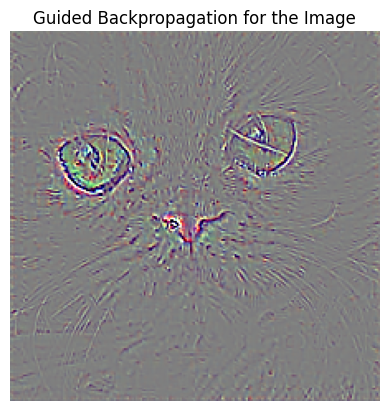

In [16]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

class GuidedBackprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval()  
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)

        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None):
        model_output = self.model(input_image)
        self.model.zero_grad()
        pred_class = model_output.argmax().item()
        grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
        grad_target_map[0][target_class if target_class is not None else pred_class] = 1
        model_output.backward(grad_target_map)
        result = self.image_reconstruction.data[0].permute(1, 2, 0)
        return result.numpy()

def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

model = models.vgg16(pretrained=True)
GBP = GuidedBackprop(model)

img_path = '/content/Images/Images/283.jpeg'
img = Image.open(img_path).convert('RGB')
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])
img_tensor = transform(img).unsqueeze(0).requires_grad_(True)
guided_result = GBP.visualize(img_tensor)
guided_result = normalize(guided_result)
plt.imshow(guided_result)
plt.title("Guided Backpropagation for the Image")
plt.axis('off')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook 

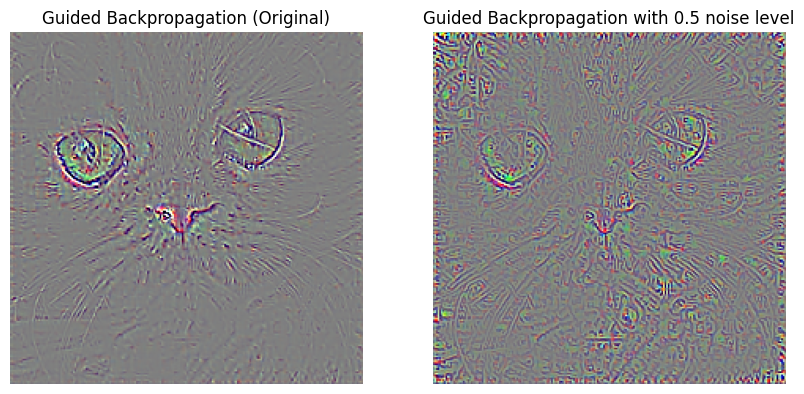

In [1]:
class GuidedBackprop():
    def __init__(self, model):
        self.model = model
        self.image_reconstruction = None
        self.activation_maps = []
        self.model.eval() 
        self.register_hooks()

    def register_hooks(self):
        def first_layer_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0]

        def forward_hook_fn(module, input, output):
            self.activation_maps.append(output)

        def backward_hook_fn(module, grad_in, grad_out):
            grad = self.activation_maps.pop()
            grad[grad > 0] = 1
            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            new_grad_in = positive_grad_out * grad
            return (new_grad_in,)

        modules = list(self.model.features.named_children())
        for name, module in modules:
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)

        first_layer = modules[0][1]
        first_layer.register_backward_hook(first_layer_hook_fn)

    def visualize(self, input_image, target_class=None):
        model_output = self.model(input_image)
        self.model.zero_grad()
        pred_class = model_output.argmax().item()
        grad_target_map = torch.zeros(model_output.shape, dtype=torch.float)
        grad_target_map[0][target_class if target_class is not None else pred_class] = 1
        model_output.backward(grad_target_map)
        result = self.image_reconstruction.data[0].permute(1, 2, 0)
        return result.numpy()

def normalize(image):
    norm = (image - image.mean()) / image.std()
    norm = norm * 0.1
    norm = norm + 0.5
    norm = norm.clip(0, 1)
    return norm

def fgsm_attack(image, epsilon, gradient):
    sign_gradient = gradient.sign()
    perturbed_image = image + epsilon * sign_gradient
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

model = models.vgg16(pretrained=True)
GBP = GuidedBackprop(model)
img_path = '/content/Images/Images/283.jpeg'
img = Image.open(img_path).convert('RGB')
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])
img_tensor = transform(img).unsqueeze(0).requires_grad_(True)
guided_result_original = GBP.visualize(img_tensor)
model_output = model(img_tensor)
loss = model_output[0, model_output.argmax()]
loss.backward()
gradient = img_tensor.grad.data

epsilon = 0.5

perturbed_img_tensor = fgsm_attack(img_tensor, epsilon, gradient)
guided_result_perturbed = GBP.visualize(perturbed_img_tensor)
guided_result_original = normalize(guided_result_original)
guided_result_perturbed = normalize(guided_result_perturbed)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(guided_result_original)
axes[0].set_title("Guided Backpropagation (Original)")
axes[0].axis('off')
axes[1].imshow(guided_result_perturbed)
axes[1].set_title("Guided Backpropagation with 0.5 noise level")
axes[1].axis('off')
plt.show()


## Feature Visualization

In [1]:
!pip install torch torchvision

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

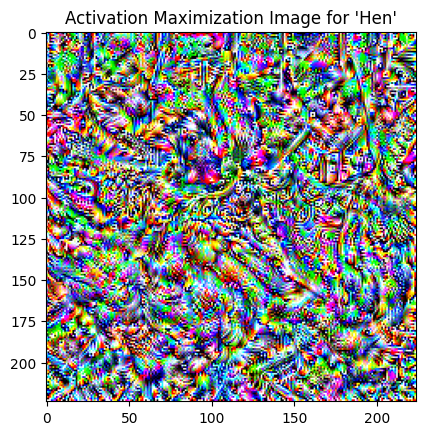

In [3]:
import torch
from torchvision import models, transforms
import matplotlib.pyplot as plt
from torch.optim import Adam
from torchvision.utils import save_image


model = models.vgg16(pretrained=True).eval()
if torch.cuda.is_available():
    model = model.cuda()


hen_class_index = 8 
image = torch.randn((1, 3, 224, 224), requires_grad=True, device="cuda" if torch.cuda.is_available() else "cpu")

optimizer = Adam([image], lr=0.1)

for i in range(100):  
    optimizer.zero_grad()
    output = model(image)
    loss = -output[0, hen_class_index] 
    loss.backward()
    optimizer.step()
    with torch.no_grad():
        image.clamp_(0, 1)

image = image.detach().cpu().squeeze()
image = transforms.ToPILImage()(image)

plt.imshow(image)
plt.title("Activation Maximization Image for 'Hen'")
plt.show()

image.save("maximized_hen_activation.png")

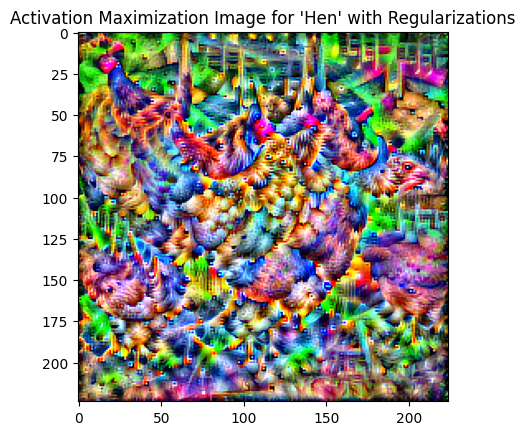

In [6]:
from torch.optim import Adam
from torchvision.transforms.functional import affine
import random

def total_variance_loss(img):
    pixel_dif1 = img[:, :, 1:, :] - img[:, :, :-1, :]
    pixel_dif2 = img[:, :, :, 1:] - img[:, :, :, :-1]
    return torch.sum(torch.abs(pixel_dif1)) + torch.sum(torch.abs(pixel_dif2))

model = models.vgg16(pretrained=True).eval()
if torch.cuda.is_available():
    model = model.cuda()

hen_class_index = 8 
image = torch.randn((1, 3, 224, 224), requires_grad=True, device="cuda" if torch.cuda.is_available() else "cpu")
optimizer = Adam([image], lr=0.1)

for i in range(300): 
    optimizer.zero_grad()

    random_shifts = [random.randint(-20, 20), random.randint(-20, 20)]
    shifted_image = affine(image, angle=0, translate=random_shifts, scale=1, shear=0)

    output = model(shifted_image)
    loss = -output[0, hen_class_index] 
    tv_loss = total_variance_loss(shifted_image)
    total_loss = loss + 0.01 * tv_loss 

    total_loss.backward()
    optimizer.step()

    with torch.no_grad():
        image.clamp_(0, 1)

image = image.detach().cpu().squeeze()
image = transforms.ToPILImage()(image)

plt.imshow(image)
plt.title("Activation Maximization Image for 'Hen' with Regularizations")
plt.show()

image.save("maximized_hen_activation_with_regularizations.png")


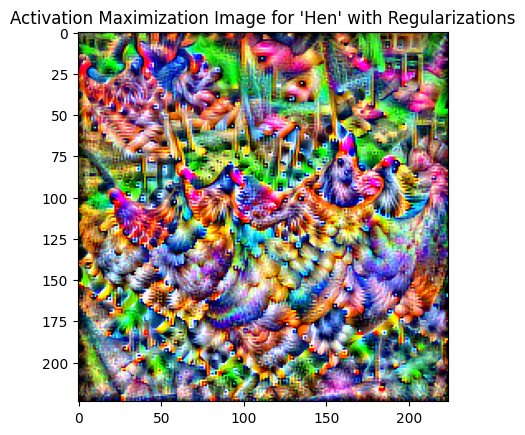

In [7]:
import torch
from torchvision import models, transforms
import matplotlib.pyplot as plt
from torch.optim import Adam
from torchvision.transforms.functional import affine
import random

def total_variance_loss(img):
    pixel_dif1 = img[:, :, 1:, :] - img[:, :, :-1, :]
    pixel_dif2 = img[:, :, :, 1:] - img[:, :, :, :-1]
    return torch.sum(torch.abs(pixel_dif1)) + torch.sum(torch.abs(pixel_dif2))

model = models.vgg16(pretrained=True).eval()
if torch.cuda.is_available():
    model = model.cuda()

hen_class_index = 8 
image = torch.randn((1, 3, 224, 224), requires_grad=True, device="cuda" if torch.cuda.is_available() else "cpu")
optimizer = Adam([image], lr=0.1)

for i in range(700):  
    optimizer.zero_grad()

    random_shifts = [random.randint(-20, 20), random.randint(-20, 20)]
    shifted_image = affine(image, angle=0, translate=random_shifts, scale=1, shear=0)

    output = model(shifted_image)
    loss = -output[0, hen_class_index]  
    tv_loss = total_variance_loss(shifted_image)
    total_loss = loss + 0.01 * tv_loss 
    total_loss.backward()
    optimizer.step()
    with torch.no_grad():
        image.clamp_(0, 1)

image = image.detach().cpu().squeeze()
image = transforms.ToPILImage()(image)

plt.imshow(image)
plt.title("Activation Maximization Image for 'Hen' with Regularizations")
plt.show()

image.save("maximized_hen_activation_with_regularizations.png")
